## Advanced Lane Finding

In [2]:
import numpy as np
import pickle
import cv2
import glob
import os
import matplotlib.pyplot as plt

In [3]:
# Setup for camera calibration

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

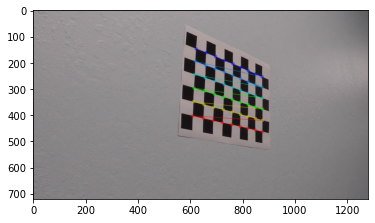

In [4]:
images = glob.glob('./camera_cal/calibration*.jpg')
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners2,ret)
        #cv2.imshow('img',img)
        plt.imshow(img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

In [5]:
# Calibration parameters
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
# Save to disk
dist_params = {"mtx": mtx, "dist": dist}
with open("data/camera_params.p", "wb") as fd:
    pickle.dump(dist_params, fd)

In [6]:
# Apply distortion correction - Understortion
def undistort(img,mtx,dist):
    #h,  w = img.shape[:2]
    #newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
    # undistort
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    # crop the image
    #x,y,w,h = roi
    #dst = dst[y:y+h, x:x+w]
    return dst

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    #return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def to_binary(img):
    img_gray = grayscale(img)
    ret,thresh = cv2.threshold(img_gray,127,255,cv2.THRESH_BINARY)
    return ret,thresh

def warper(img, src, dst, inv=False):
    
    # Compute and apply perpective transform
    #img_size = img.shape
    img_size = (img.shape[1], img.shape[0])
    if inv == False:
        M = cv2.getPerspectiveTransform(src, dst)
    else:
        M = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image
    return warped

def plot_image(images):
    for i in xrange(6):
        plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
    plt.show()

def plot_before_after(fname: str, img1, str1: str, img2, str2: str, grayscale=False):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(str1, fontsize=35)
    if grayscale:
        ax2.imshow(img2, cmap='gray')
    else:
        ax2.imshow(img2)
    ax2.set_title(str2, fontsize=35)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.savefig(fname)
    plt.show()

def plot_point(img,plist):
    plt.imshow(img)
    for i in range(len(plist)):
        plt.plot(plist[i][0],plist[i][1], '.')
    plt.show()

def load_image(image, mtx, dist):
    #img = cv2.imread(image)
    img = plt.imread(image)
    img_u = undistort(img, mtx, dist)
    return img, img_u

def get_file_names(path2files: str):
    # work with test images
    images = glob.glob(path2files)
    fname = os.path.basename(images[0])
    name = fname.split('.')[0]
    return name, fname, images

def color_gradient(img):
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    # Explore gradients in other colors spaces / color channels to see
    # what might work better to get the lane lines
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions
    # in green and blue, respectively.
    # This returns a stack of the two binary images, 
    # whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return color_binary, combined_binary

In [7]:
# Read in the saved camera parameters
dist_pickle = pickle.load( open( "data/camera_params.p", "rb" ) )
mtx  = dist_pickle["mtx"]
dist = dist_pickle["dist"]
images = glob.glob('./camera_cal/calibration*.jpg')

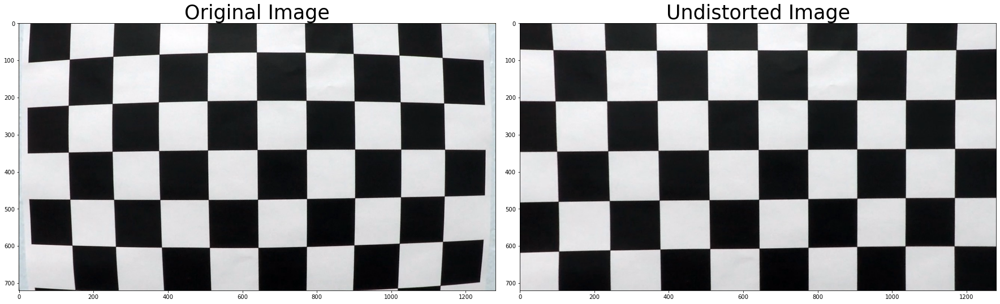

In [8]:
# Apply distortion correction
img = cv2.imread(images[0])
fname = os.path.basename(images[0])

dst = undistort(img,mtx,dist)
# save undistort
cv2.imwrite('output_images/calibresult.png',dst)
# plot images
plot_before_after(fname, img, "Original Image", dst, "Undistorted Image")

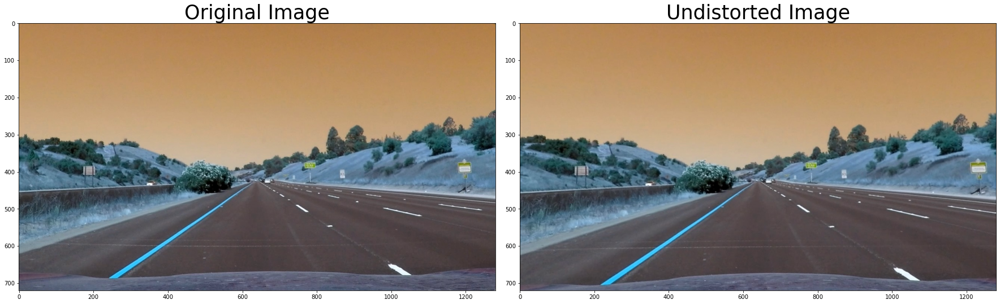

In [9]:
# work with test images
name, fname, images = get_file_names('./test_images/*.jpg')
img = cv2.imread(images[0])
udst = undistort(img,mtx,dist)
cv2.imwrite('./output_images/' + name + '_undistorted.png', udst)
# Plot test image
plot_before_after(fname, img, "Original Image", udst, "Undistorted Image")

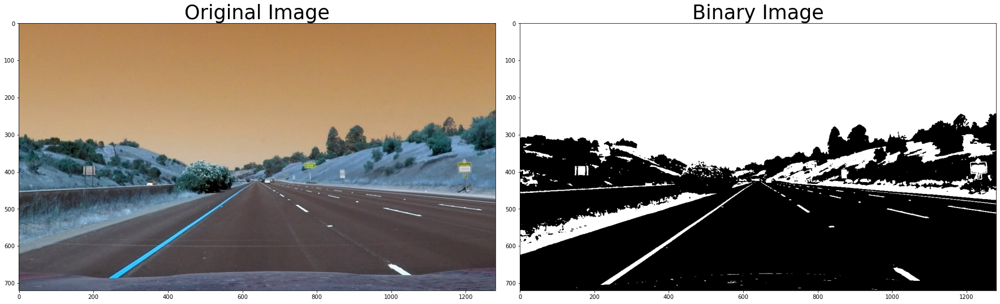

In [10]:
# Apply color transforms and 
# create a thresholded binary image.
ret, img_binary = to_binary(udst)
# save binary
cv2.imwrite('./output_images/' + name + '_binary1.png', img_binary)
# plot test image
plot_before_after(fname, img, "Original Image", img_binary, "Binary Image", True)

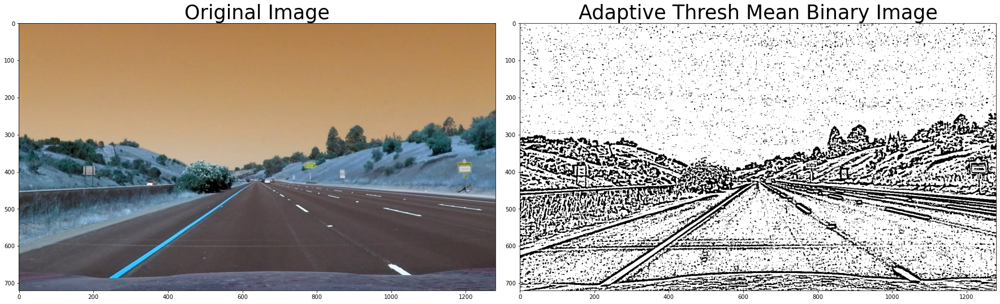

In [11]:
th2 = cv2.adaptiveThreshold(grayscale(udst),255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2)
cv2.imwrite('./output_images/' + name + '_binary2.png',th2)
plot_before_after(fname, img, "Original Image", th2, "Adaptive Thresh Mean Binary Image", True)

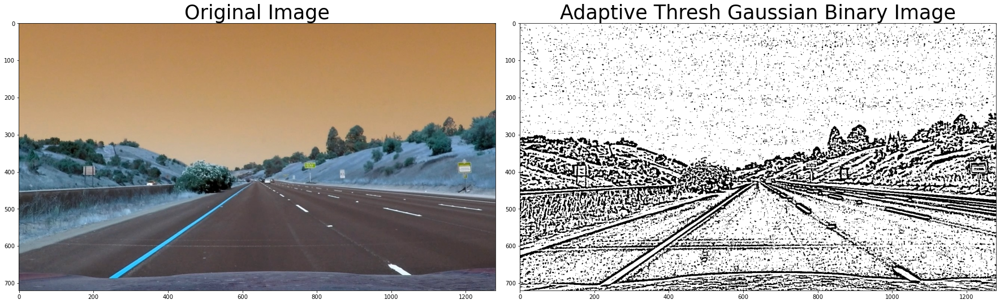

In [12]:
th3 = cv2.adaptiveThreshold(grayscale(dst),255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)
cv2.imwrite('./output_images/' + name + '_binary3.png',img_binary)
plot_before_after(fname, img, "Original Image", th2, "Adaptive Thresh Gaussian Binary Image", True)

In same cases, the standard grayscaling can lose color information for the lane lines, impacting the results, as we can see in the next example.

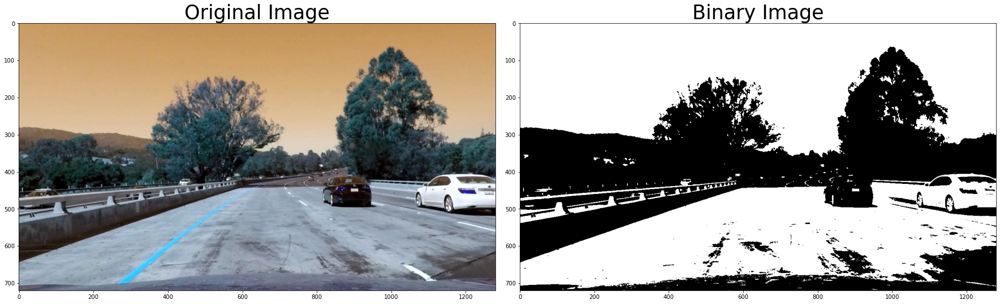

In [13]:
img = cv2.imread(images[2])
udst = undistort(img,mtx,dist)
fname = os.path.basename(images[2])
name = fname.split('.')[0]
# create a thresholded binary image.
ret, img_binary = to_binary(udst)
# save image
cv2.imwrite('./output_images/' + name + '_binary4.png',img_binary)
# Plot test image
plot_before_after(fname, udst, "Original Image", img_binary, "Binary Image", True)

Note that is virtually impossible to see the lane lines. So, lets apply the color gradient process, intead of the standard binary process.

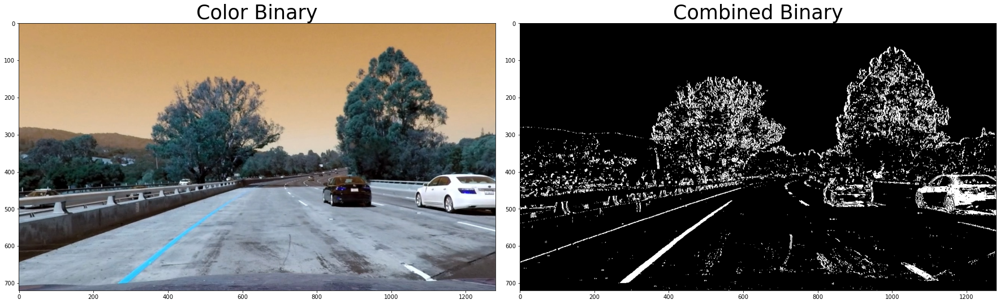

In [14]:
color_binary, combined_binary = color_gradient(udst)
# save image
cv2.imwrite('./output_images/' + name + '_binary5.png',combined_binary)
# Plot test image
plot_before_after(fname, udst, "Color Binary", combined_binary, "Combined Binary", True)

Note that now its possible to process the lane lines.

In [15]:
name, fname, images = get_file_names('./test_images/*.jpg')
img, udst = load_image(images[0], mtx, dist)

In [16]:
img_size = (img.shape[1], img.shape[0])
h, w = img.shape[:2]

img1 = np.copy(udst)

src = np.float32(
    [[w-160, h],                # lower right
    [160, h],                   # lower left
    [(w/2)-70, (h/2)+100],      # upper left
    [(w/2)+70, (h/2)+100]])     # upper right
dst = np.float32(
    [[w-160, h],                # lower right
    [160, h],                   # lower left
    [160, 0],                   # upper left
    [w-160, 0]])                # upper right

In [17]:
pts  = np.array([[1120,719],[190,719],[570,460],[710,460]],np.int32)
pts1 = np.array([pts[0], pts[1], [pts[1][0],0], [pts[0][0],0]],np.int32)
cv2.polylines(img1, [pts], True, (255,0,0), 3)
img1_warped = warper(udst, src, dst)
binary_warp = to_binary(img1_warped)

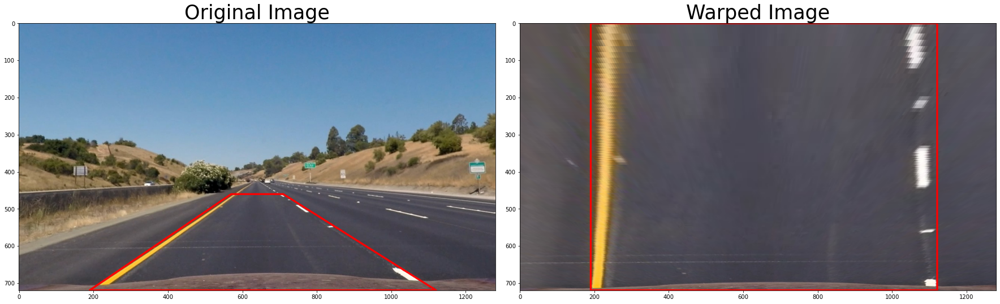

In [18]:
fname = os.path.basename(images[0])
name = fname.split('.')[0]
# save warped
cv2.imwrite('./output_images/' + name + '_warped.png', img1_warped)
cv2.polylines(img1_warped, [pts1], True, (255,0,0), 3)
# plot warped
plot_before_after(fname, img1, "Original Image", img1_warped, "Warped Image")

Now we need detect the lane pixels and fit to find the lane boundary.

In [19]:
import collections
# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30./720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # flag to mark if the line was detected the last iteration
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = collections.deque(12*[0.0, 0.0, 0.0], 12) 
        # average x values of the fitted line over the last n iterations
        self.bestx = None     
        # polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        # polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        # radius of curvature of the line in some units
        self.radius_of_curvature = None
        # fit radius of curvature of the line
        self.fit_cr = None 
        # distance in meters of vehicle center from the line
        self.line_base_pos = None 
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        # x values for detected line pixels
        self.allx = None  
        # y values for detected line pixels
        self.ally = None
        # threshold pixels number in line
        self.min_pixels = 1500 
        
    def polyfit(self):
        return np.polyfit(self.ally, self.allx, 2)
    
    def save_line(self, x, y):
        if(len(x) < self.min_pixels):
            self.detected = False
        else:
            self.allx = x
            self.ally = y
    
    def sanity_check(self, line2fit):
        # To confirm if detected lines are real:
        # - Check if lines have similar curvature
        # - Check if lines are separeted by approximately by the right horizontal distance
        # - Check if lines are roughly parallel
        if abs(self.current_fit[1] - line2fit[1]) > 0.18:
            self.current_fit = self.best_fit     # get old value
            self.detected = False
        else:
            self.current_fit = line2fit
            self.recent_xfitted.pop()
            self.recent_xfitted.appendleft(self.current_fit)
            avg = np.array([0,0,0], dtype='float')
            for pixel in self.recent_xfitted:
                avg += pixel
            self.best_fit = avg / (len(self.recent_xfitted))
    
    def calculate_line_inds(self, nonzero, margin):
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        inds = ((nonzerox > (self.current_fit[0]*(nonzeroy**2) + self.current_fit[1]*nonzeroy + 
        self.current_fit[2] - margin)) & (nonzerox < (self.current_fit[0]*(nonzeroy**2) + 
        self.current_fit[1]*nonzeroy + self.current_fit[2] + margin)))
        return inds

    # Generate x and y values to plot
    # f(y) = A*y**2 + B*y + C
    def line2plot(self, ploty):
        return self.current_fit[0]*ploty**2 + self.current_fit[1]*ploty + self.current_fit[2]

    def measure_curvature_pixels(self, y_eval):
        # Define y-value where we want radius of curvature
        # We'll choose the maximum y-value, corresponding to the bottom of the image
        
        # calculation of R_curve (radius of curvature)
        curverad = ((1 + (2*self.current_fit[0]*y_eval + 
                    self.current_fit[1])**2)**1.5) / np.absolute(2*self.current_fit[0])
        return curverad

    def measure_curvature_real(self, y_eval):
        # Fit a second order polynomial to each
        self.fit_cr = np.polyfit(self.ally * ym_per_pix, self.allx * xm_per_pix, 2)
        
        # Calculate the new radius of curvature in meters
        self.radius_of_curvature = ((1 + (2 * self.fit_cr[0] * y_eval * ym_per_pix +
                                    self.fit_cr[1])**2)**1.5) / np.absolute(2 * self.fit_cr[0])
   
    def vehicle_pos(self, y_eval):
        # Calculate x bottom position for y for this lane
        lane_bottom = (self.fit_cr[0] * (y_eval * ym_per_pix) ** 2 + 
                        self.fit_cr[1] * (y_eval * ym_per_pix) + self.fit_cr[2])
        return lane_bottom


In [20]:
fname = os.path.basename(images[4])
name = fname.split('.')[0]
image = cv2.imread(images[4])
img = np.copy(image)
left_line  = Line()
right_line = Line()

In [21]:
def image_thresholded(image, mtx, dist):
    # get undistorted image
    udist = undistort(image, mtx, dist)
    # get combined binary using sobel algo
    color_binary, combined_binary = color_gradient(udist)
    return combined_binary, udist

def find_lane_pixels(binary_warped, left_line, right_line):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255.
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # use sliding windows only if lanes are invalid
    if left_line.detected == False or right_line.detected == False:
        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1) * window_height
            win_y_high = binary_warped.shape[0] - window * window_height
            ### Find the four below boundaries of the window ###
            win_xleft_low = leftx_current - margin  # Update this
            win_xleft_high = leftx_current + margin  # Update this
            win_xright_low = rightx_current - margin  # Update this
            win_xright_high = rightx_current + margin  # Update this
            
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),
            (win_xright_high,win_y_high),(0,255,0), 2) 
            
            ### Identify the nonzero pixels in x and y within the window ###
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            
            ### If we found > minpix pixels, recenter next window ###
            ### (`right` or `leftx_current`) on their mean position ###
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
            # make sure the lines are validated
            left_line.detected = True
            right_line.detected = True
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass
    else:
        # Search for lanes using the previous saved region of interest
        # Set the area of search based on activated x-values
        # within the +/- margin of our polynomial function
        # We consider the window areas for the similarly named variables
        # when lines detected, but change the windows to new search area
        left_lane_inds  = left_line.calculate_line_inds(nonzero, margin)
        right_lane_inds = right_line.calculate_line_inds(nonzero, margin)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return histogram, leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped, left_line, right_line):
    # Find our lane pixels first
    hist, leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, left_line, right_line)

    # Smoothing
    # only saves if the number of pixels is significative
    # to prevent case of almost empty x, y
    left_line.save_line(leftx, lefty)
    right_line.save_line(rightx, righty)
    ### Fit a second order polynomial to each using `np.polyfit` ###
    left_fit  = left_line.polyfit()
    right_fit = right_line.polyfit()

    # Sanity check to make sure the detected lines makes sense
    # To confirm if detected lines are real:
    # - Check if lines have similar curvature
    # - Check if lines are separeted by approximately by the right horizontal distance
    # - Check if lines are roughly parallel
    # We are supposing lines 3.7 m wide and 3.0 m long.
    if left_line.current_fit[0] == False:
        left_line.current_fit = left_fit
        right_line.current_fit = right_fit
    # check for valid lines
    left_line.sanity_check(left_fit)
    right_line.sanity_check(right_fit)

    if (abs(right_line.current_fit[1] - right_fit[1]) > 0.38 and
        abs(left_line.current_fit[1] - left_fit[1]) < 0.1):
        right_line.current_fit[0] = left_line.current_fit[0]
        right_line.current_fit[1] = left_line.current_fit[1]
        right_line.current_fit[2] = left_line.current_fit[2] + 900
        right_line.recent_xfitted.pop()
        right_line.recent_xfitted.appendleft(right_line.current_fit)
        avg = np.array([0,0,0], dtype='float')
        for pixel in right_line.recent_xfitted:
            avg += pixel
        right_line.best_fit = avg / (len(right_line.recent_xfitted))
        
    if (abs(left_line.current_fit[1] - left_fit[1]) > 0.38 and
        abs(right_line.current_fit[1] - right_fit[1]) < 0.1):
        left_line.current_fit = left_fit
        left_line.recent_xfitted.pop()
        left_line.recent_xfitted.appendleft(left_line.current_fit)
        avg = np.array([0,0,0], dtype='float')
        for pixel in left_line.recent_xfitted:
            avg += pixel
        left_line.best_fit = avg / (len(left_line.recent_xfitted))

    # Generate x and y values for plotting
    # Calc both polynomials using ploty, left_fit and right_fit
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    try:
        left_fitx  = left_line.line2plot(ploty)
        right_fitx = right_line.line2plot(ploty)
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255.
    window_img = np.zeros_like(out_img)
    # Color the pixels in the left lane region
    out_img[left_line.ally, left_line.allx] = [255, 0, 0]
    # Color the pixels in the right lane region
    out_img[right_line.ally, right_line.allx] = [0, 0, 255]

    ###
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,1,0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,1,0))
    #result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    ###

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    # invert the y axis
    #ax = plt.gca()
    #ax.set_ylim(ax.get_ylim()[::-1])
    #plt.gca().invert_yaxis()
    #plt.imshow(out_img)
    #plt.show()
    #plt.imshow(result)
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    return out_img, result, ploty, left_fit, right_fit, left_fitx, right_fitx

def vehicle_position(ploty):
    y_eval = np.max(ploty)
    # Using the bottom position, we calculate the mid point
    lane_midpoint = float(left_line.vehicle_pos(y_eval) + right_line.vehicle_pos(y_eval)) / 2.
    # We suppose the car position is in the image center in meters
    image_mid2meter = (1280/2.) * xm_per_pix
    # Now if the signal is positive, the vehicle is on the right side of the lane center. Otherwise, in the left
    v_position = (image_mid2meter - lane_midpoint)
    return v_position

def display_image(warped, undistorted, out_img, ploty, left_fitx, right_fitx, v_position):
    # Create an image to draw the lines on
    #warp_zero = np.zeros_like(warped).astype(np.uint8)
    #warped = warped*255.
    color_warp = np.dstack((warped, warped, warped))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = warper(color_warp, src, dst, inv=True)
    newwarp = undistort(newwarp, mtx, dist)
    
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    x_offset1 = result.shape[1] - 320 - 30
    y_offset = 65
    thumb = cv2.resize(out_img, (320, 200), interpolation = cv2.INTER_CUBIC)
    result[y_offset:y_offset + thumb.shape[0], x_offset1:x_offset1 + thumb.shape[1]] = thumb
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    v_position = vehicle_position(ploty)
    v_position = np.round(v_position,2)
    vehicle_label = f'Vehicle is {v_position}m right of center.'
    if v_position < 0:
        v_position = abs(v_position)
        vehicle_label = f'Vehicle is {v_position}m left of center.'
    lcurv_label = f'Radius Left Curvature: {np.int(left_line.radius_of_curvature)}m.'
    rcurv_label = f'Radius Right Curvature: {np.int(right_line.radius_of_curvature)}m.'
    cv2.putText(result, lcurv_label, (30, 50), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result, rcurv_label, (30, 100), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result, vehicle_label, (30, 150), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result, 'Lane Lines', (x_offset1+70, 50), font, 1, (255,255,255), 2, cv2.LINE_AA)
    return result

In [22]:
# get the thresholded image
combined_binary, _ = image_thresholded(img, mtx, dist)
# warp image
bin_warped = warper(combined_binary, src, dst)

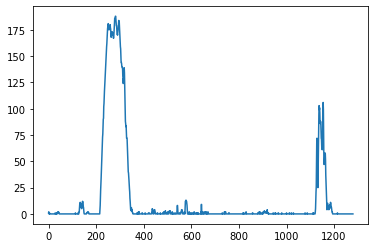

In [23]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]
    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    return histogram

# Create histogram of image binary activations
histogram = hist(bin_warped)
# save to disk
filesaved = './output_images/' + name + '_hist.png'
# Visualize the resulting histogram
plt.plot(histogram)
plt.savefig(filesaved)

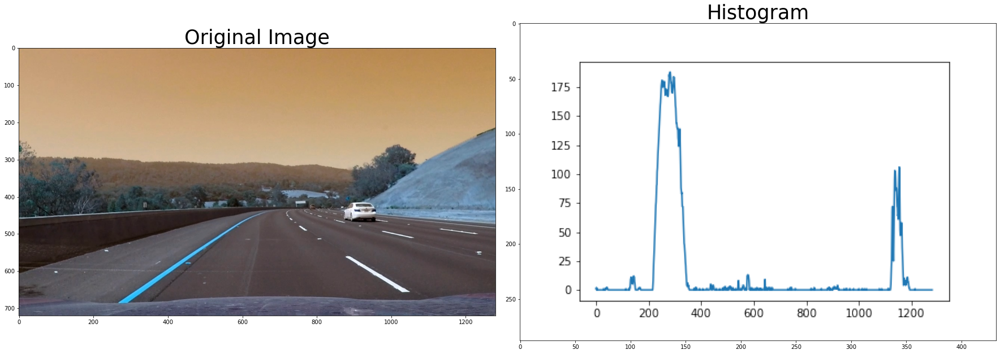

In [24]:
himage = plt.imread(filesaved)
plot_before_after(fname, img, "Original Image", himage, "Histogram", True)

In [25]:
# change pixels image to 0,1 interval
bin_warped2 = bin_warped/255.
# detect the lane lines
out_img, res, ploty, left_fit, right_fit, left_fitx, right_fitx = fit_polynomial(bin_warped2, left_line, right_line)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


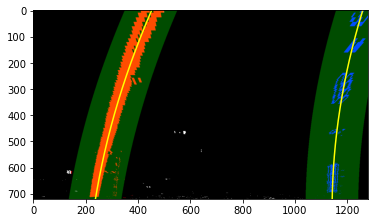

In [26]:
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.imshow(res)
plt.show()

In [27]:
y_eval = np.max(ploty)
left_curverad  = left_line.measure_curvature_pixels(y_eval)
right_curverad = right_line.measure_curvature_pixels(y_eval)
avg_curverad   = (left_curverad + right_curverad) / 2.
print(left_curverad, right_curverad, avg_curverad)

2783.4189602011193 2480.99093969951 2632.2049499503146


In [28]:
# Pixels do real world.
# The lane is about 30 meters long and 3.7 meters wide
left_line.measure_curvature_real(y_eval)
right_line.measure_curvature_real(y_eval)
# average distance
curverad_avg = (left_line.radius_of_curvature + right_line.radius_of_curvature) / 2.
print(np.round(left_line.radius_of_curvature,0), 'm,', np.round(right_line.radius_of_curvature,0), 'm,', np.round(curverad_avg,0), 'm')


879.0 m, 815.0 m, 847.0 m


In [29]:
# Calculate the vehicle position in the image
v_position = vehicle_position(ploty)
if v_position > 0:
    print(f"The vehicle is {np.round(v_position,2)}m right of center")
else:
    print(f"The vehicle is {np.round(v_position,2)*(-1)}m left of center")

The vehicle is 0.26m left of center


In [30]:
import matplotlib.image as mpimg

# Now we have a complete pipeline to process the frames of a video
def process_image(img):
    # get the thresholded image
    combined_binary, undist = image_thresholded(img, mtx, dist)
    # warp image
    bin_warped = warper(combined_binary, src, dst)
    # detect the lane lines
    out_img, res, ploty, left_fit, right_fit, left_fitx, right_fitx = fit_polynomial(bin_warped/255., left_line, right_line)
    y_eval = np.max(ploty)
    left_curverad  = left_line.measure_curvature_pixels(y_eval)
    right_curverad = right_line.measure_curvature_pixels(y_eval)
    avg_curverad  =  (left_curverad + right_curverad) / 2.
    # Measure radius curve in meters
    left_line.measure_curvature_real(y_eval)
    right_line.measure_curvature_real(y_eval)
    # average distance
    curverad_avg = (left_line.radius_of_curvature + right_line.radius_of_curvature) / 2.
    result = display_image(bin_warped, undist, out_img, ploty, left_fitx, right_fitx, v_position)
    return result


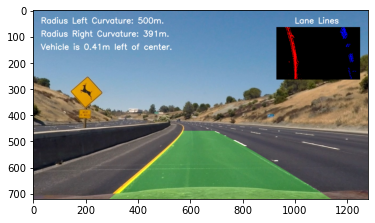

In [31]:
image = mpimg.imread(images[3])
img = np.copy(image)
left_line  = Line()
right_line = Line()
img_result = process_image(img)
plt.imshow(img_result)
plt.show()

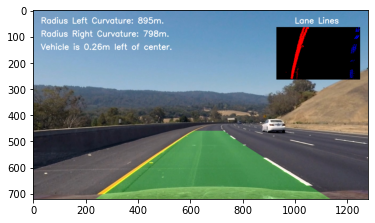

In [32]:
left_line  = Line()
right_line = Line()
plt.imshow(process_image(mpimg.imread(images[4])))
plt.show()

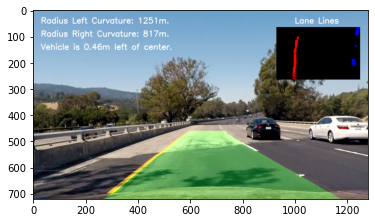

In [33]:
image = mpimg.imread(images[5])
left_line  = Line()
right_line = Line()
plt.imshow(process_image(image))
plt.show()

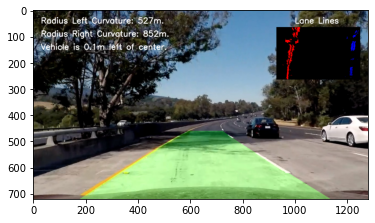

In [34]:
left_line  = Line()
right_line = Line()
plt.imshow(process_image(mpimg.imread(images[6])))
plt.show()

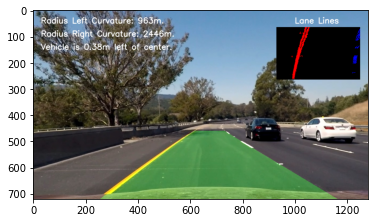

In [35]:
left_line  = Line()
right_line = Line()
plt.imshow(process_image(mpimg.imread(images[7])))
plt.show()

## Process the video

In [28]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
left_line = Line()
right_line = Line()
output_video = 'project_video_processed-00.mp4'
clip1 = VideoFileClip("project_video.mp4") #.subclip(0,3)
video_clip = clip1.fl_image(process_image)
%time video_clip.write_videofile(output_video, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]Moviepy - Building video project_video_processed-00.mp4.
Moviepy - Writing video project_video_processed-00.mp4

Moviepy - Done !
Moviepy - video ready project_video_processed-00.mp4
Wall time: 3min 12s


In [145]:
left_line = Line()
right_line = Line()
output_video = 'challenge_video_processed-00.mp4'
clip1 = VideoFileClip("challenge_video.mp4")#.subclip(0,3)
video_clip = clip1.fl_image(process_image)
%time video_clip.write_videofile(output_video, audio=False)

t:   0%|          | 0/90 [00:00<?, ?it/s, now=None]Moviepy - Building video challenge_video_processed-00.mp4.
Moviepy - Writing video challenge_video_processed-00.mp4

Moviepy - Done !
Moviepy - video ready challenge_video_processed-00.mp4
Wall time: 14.5 s


In [147]:
left_line = Line()
right_line = Line()
output_video = 'harder_challenge_video_processed-00.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4") #.subclip(0,3)
video_clip = clip1.fl_image(process_image)
%time video_clip.write_videofile(output_video, audio=False)

t:   0%|          | 0/1199 [00:00<?, ?it/s, now=None]Moviepy - Building video harder_challenge_video_processed-00.mp4.
Moviepy - Writing video harder_challenge_video_processed-00.mp4

Moviepy - Done !
Moviepy - video ready harder_challenge_video_processed-00.mp4
Wall time: 3min 22s
